Read the events file and create a dataframe

In [45]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import mysql.connector
import seaborn as sns
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

Read events dataset file and load to data frame

In [3]:
dtype_dic= {'device_id':str}
df_events = pd.read_csv("events_data.csv", dtype = dtype_dic)

Analyze the df_events data frame, device_id is important column

In [4]:
df_events.head()

,event_id,device_id,timestamp,longitude,latitude,city,state
0,2765368,2973347786994914304,2016-05-07 22:52:05,77.225676,28.730140,Delhi,Delhi
1,2955066,4734221357723754978,2016-05-01 20:44:16,88.388361,22.660325,Calcutta,WestBengal
2,605968,-3264499652692492784,2016-05-02 14:23:04,77.256809,28.757906,Delhi,Delhi
3,448114,5731369272434022440,2016-05-03 13:21:16,80.343613,13.153332,Chennai,TamilNadu
4,665740,338888002570799963,2016-05-06 03:51:05,85.997745,23.842609,Bokaro,Jharkhand


In [7]:
print (df_events.shape)
print (df_events['device_id'].nunique())

(3252950, 7)
60865


Check for only 6 states which is of focus

In [14]:
# States to focus for Consulting
# TamilNadu, Manipur, Chandigarh, Tripura, UttarPradesh, ArunachalPradesh
states = ['TamilNadu','Manipur','Chandigarh','Tripura','UttarPradesh','ArunachalPradesh']
df_sixstates = df_events.loc[df_events['state'].isin(states)]

In [17]:
df1 = df_sixstates.drop_duplicates('device_id')
df1.shape

(9564, 7)

In [15]:
print(df_sixstates.shape)
print (df_sixstates['device_id'].nunique())

(534415, 7)
9563


Read the gender file

In [23]:
# Unique events
df_sixstates_unique = df_sixstates.drop_duplicates('device_id')
print (df_sixstates_unique.shape)

(9564, 7)


In [10]:
dtype_dic= {'device_id':str}
df_gender = pd.read_csv("gender_age_train.csv", dtype = dtype_dic)
df_gender.shape

(74645, 4)

In [11]:
print(df_gender.dtypes)
print (df_gender['device_id'].nunique())

device_id    object
gender       object
age           int64
group        object
dtype: object
74645


In [12]:
# Fid out how many device ids are common between gender and events table
df_gender['device_id'].isin(df_events['device_id']).value_counts()

True     60865
False    13780
Name: device_id, dtype: int64

In [16]:
df_gender['device_id'].isin(df_sixstates['device_id']).value_counts()

False    65082
True      9563
Name: device_id, dtype: int64

Read the barnd event file

In [21]:
dtype_dic= {'device_id':str}
df_brand = pd.read_csv("phone_brand_device_model.csv", dtype = dtype_dic)
print(df_brand.shape)
print (df_brand['device_id'].nunique())
print(df_brand.dtypes)

(87726, 3)
87726
device_id       object
phone_brand     object
device_model    object
dtype: object


In [29]:
df_brand['device_id'].isin(df_sixstates_unique['device_id']).value_counts()

False    78163
True      9563
Name: device_id, dtype: int64

The chineese characters in phone_brand needs to be replaced with English characters

In [33]:
df_brand['phone_brand'].replace('华为','Huawei',inplace=True)
df_brand['phone_brand'].replace('小米','Xiaomi',inplace=True)
df_brand['phone_brand'].replace('三星','Samsung',inplace=True)
df_brand['phone_brand'].replace('魅族','Meizu',inplace=True)
df_brand['phone_brand'].replace('酷派','Coolpad',inplace=True)
df_brand['phone_brand'].replace('乐视','LeEco',inplace=True)
df_brand['phone_brand'].replace('联想','Lenovo',inplace=True)

In [35]:
df_brand['phone_brand'].unique()

array(['vivo', 'Xiaomi', 'OPPO', 'Samsung', 'Coolpad', 'Lenovo', 'Huawei',
       '奇酷', 'Meizu', '斐讯', '中国移动', 'HTC', '天语', '至尊宝', 'LG', '欧博信', '优米',
       'ZUK', '努比亚', '惠普', '尼比鲁', '美图', '乡米', '摩托罗拉', '梦米', '锤子', '富可视',
       'LeEco', '海信', '百立丰', '一加', '语信', '海尔', '酷比', '纽曼', '波导', '朵唯',
       '聆韵', 'TCL', '酷珀', '爱派尔', 'LOGO', '青葱', '果米', '华硕', '昂达', '艾优尼',
       '康佳', '优购', '邦华', '赛博宇华', '黑米', 'Lovme', '先锋', 'E派', '神舟', '诺基亚',
       '普耐尔', '糖葫芦', '亿通', '欧新', '米奇', '酷比魔方', '蓝魔', '小杨树', '贝尔丰', '糯米',
       '米歌', 'E人E本', '西米', '大Q', '台电', '飞利浦', '唯米', '大显', '长虹', '维图',
       '青橙', '本为', '虾米', '夏新', '帷幄', '百加', 'SUGAR', '欧奇', '世纪星', '智镁',
       '欧比', '基伍', '飞秒', '德赛', '易派', '谷歌', '金星数码', '广信', '诺亚信', 'MIL',
       '白米', '大可乐', '宝捷讯', '优语', '首云', '瑞米', '瑞高', '沃普丰', '摩乐', '鲜米',
       '凯利通', '唯比', '欧沃', '丰米', '恒宇丰', '奥克斯', '西门子', '欧乐迪', 'PPTV'],
      dtype=object)

Merging Strategy
1) df_gender and df_brand will me merged with equi join  
2) Merged table would be merged with df_sixstates_unique with left join

In [37]:
merged1 = pd.merge(df_gender, df_brand, on='device_id')

In [39]:
print (merged1.shape)
print(merged1.isnull().sum())
merged1['device_id'].isin(df_sixstates_unique['device_id']).value_counts()

(74617, 6)
device_id       0
gender          0
age             0
group           0
phone_brand     0
device_model    0
dtype: int64


False    65054
True      9563
Name: device_id, dtype: int64

In [40]:
df_final = pd.merge(merged1, df_sixstates_unique, on='device_id', how='left')

In [41]:
print (df_final.shape)
print(df_final.isnull().sum())

(74617, 12)
device_id           0
gender              0
age                 0
group               0
phone_brand         0
device_model        0
event_id        65054
timestamp       65054
longitude       65054
latitude        65054
city            65054
state           65054
dtype: int64


# Analysis of the preprocessed Data.

## 1 Distribution of Users(device_id) across States.

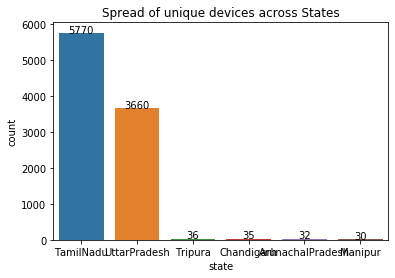

In [59]:
group_df = df_final.groupby('state')['device_id'].count().reset_index(name='count')\
              .sort_values(['count'], ascending=False)
group_df
ax=sns.barplot(x='state',y='count',data=group_df)
ax.set_title("Spread of unique devices across States")
for p in zip(ax.get_xticks(), group_df['count']):
    ax.text(p[0], p[1], p[1], color='black', ha="center")

## 2 Distribution of Users across Phone Brands(Consider only 10 Most used Phone Brands).

   phone_brand  count
16      Xiaomi  18399
14     Samsung  16287
3       Huawei  12912
18        vivo   6439
11        OPPO   5754
10       Meizu   4737
0      Coolpad   3419
2          HTC   1092
7       Lenovo    836
6        LeEco    711


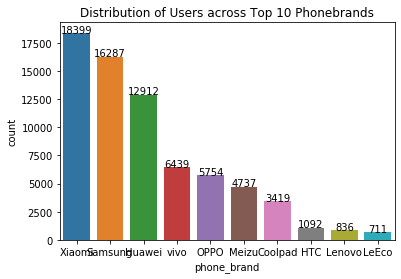

In [61]:
group_df = df_final.groupby('phone_brand')['device_id'].count() \
                  .reset_index(name='count') \
                  .sort_values(['count'], ascending=False).head(10)
print(group_df)
ax=sns.barplot(x='phone_brand',y='count',data=group_df)
ax.set_title("Distribution of Users across Top 10 Phonebrands")
for p in zip(ax.get_xticks(), group_df['count']):
    ax.text(p[0], p[1], p[1], color='black', ha="center")

## 3 Distribution of Users across Gender.

  gender  count
0      F  26733
1      M  47884


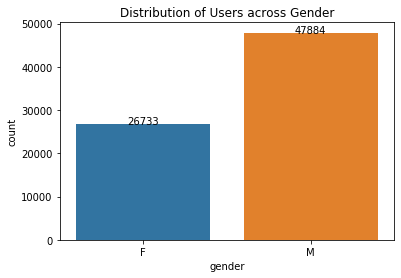

In [63]:
group_df = df_final.groupby('gender')['device_id'].count() \
                  .reset_index(name='count')
print(group_df)
ax=sns.barplot(x='gender',y='count',data=group_df)
ax.set_title("Distribution of Users across Gender")
for p in zip(ax.get_xticks(), group_df['count']):
    ax.text(p[0], p[1], p[1], color='black', ha="center")

## 4 Distribution of Users across Age Segments

     group  count
0     F23-   5049
1   F24-26   4189
2   F27-28   3117
3   F29-32   4626
4   F33-42   5558
5     F43+   4194
6     M22-   7485
7   M23-26   9598
8   M27-28   5442
9   M29-31   7308
10  M32-38   9473
11    M39+   8578


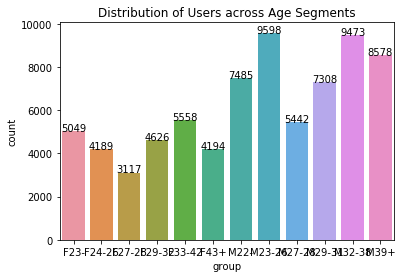

In [64]:
group_df = df_final.groupby('group')['device_id'].count() \
                  .reset_index(name='count')
print(group_df)
ax=sns.barplot(x='group',y='count',data=group_df)
ax.set_title("Distribution of Users across Age Segments")
for p in zip(ax.get_xticks(), group_df['count']):
    ax.text(p[0], p[1], p[1], color='black', ha="center")

## 5 Distribution of Phone Brands(Consider only 10 Most used Phone Brands) for each Age Segment, State, Gender.

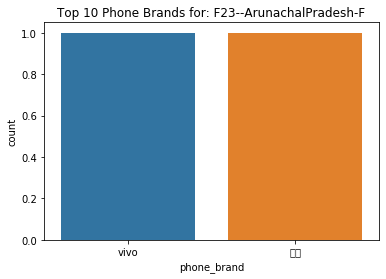

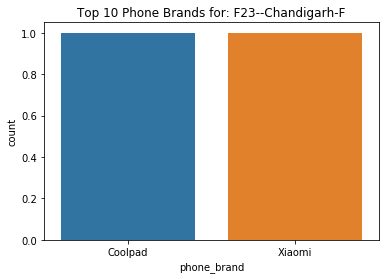

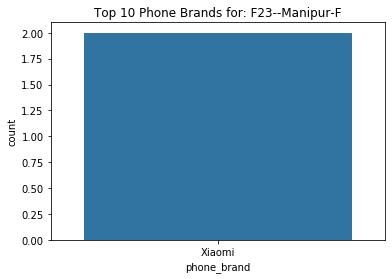

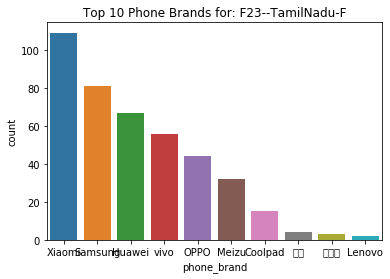

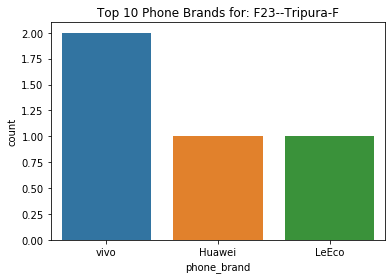

...

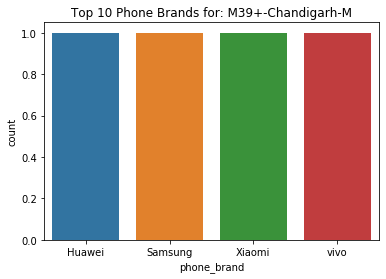

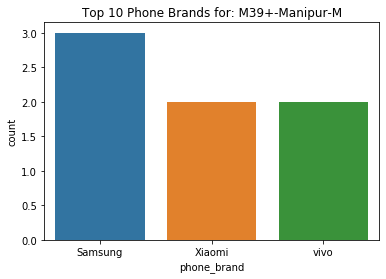

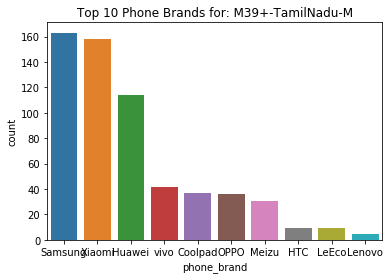

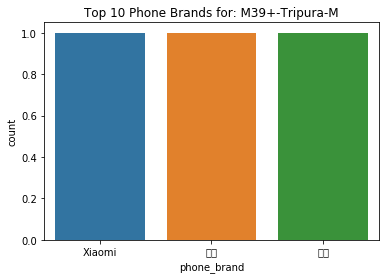

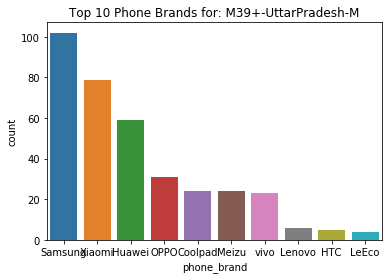

In [149]:
group_df=df_final.groupby(['group','state','gender','phone_brand'])['phone_brand'].count().reset_index(name='count')
group_df['type'] = group_df['group'] + "-" + group_df['state']+ "-" + group_df['gender']
group_df1 = group_df[['type','phone_brand','count']]
#print(group_df1['type'].unique())

list1 = (group_df1['type'].unique())
#list1 = ['F23--ArunachalPradesh-F']
for item in list1:
    df_tmp = group_df1.loc[group_df1['type']==item]
    #print(df_tmp)
    grouped1=df_tmp.sort_values(by =['count'], ascending=False).head(10)
    g=sns.barplot(x='phone_brand',y='count',data=grouped1)
    g.set_title("Top 10 Phone Brands for: " + item)
    plt.show()

## 6 Distribution of Gender for each State, Age Segment and Phone Brand(Consider only 10 Most used Phone Brands).

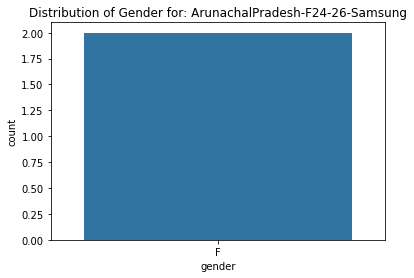

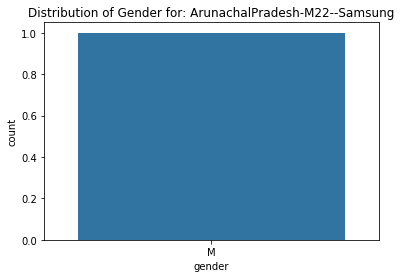

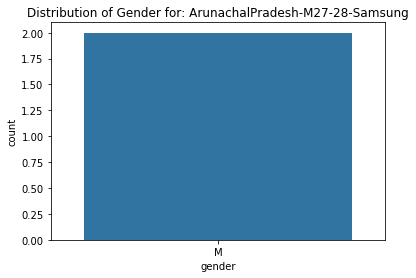

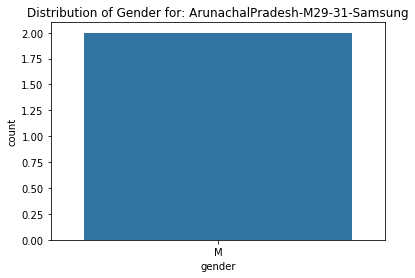

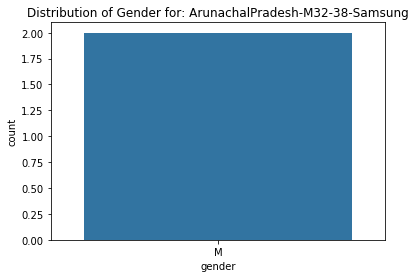

...

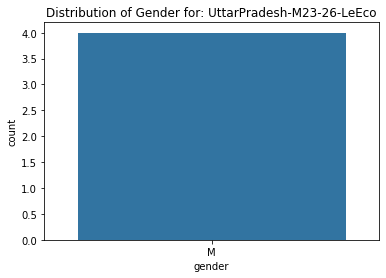

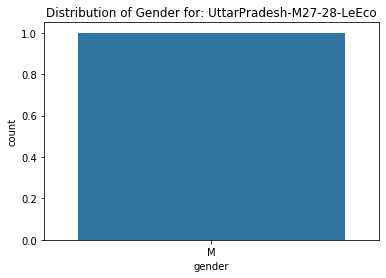

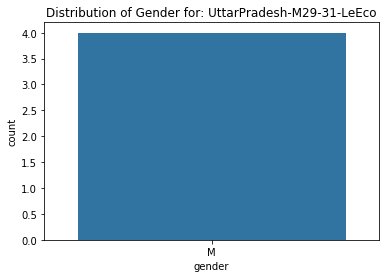

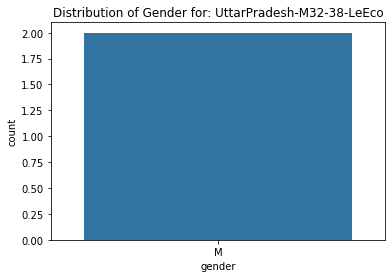

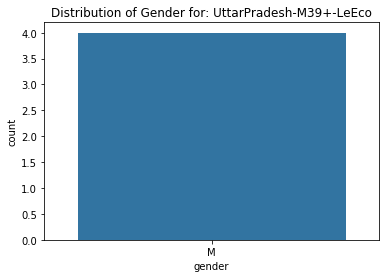

In [160]:
phone_list = ['Samsung', 'Xiaomi','Huawei','OPPO','Coolpad','Meizu','vivo','Lenovo','HTC','LeEco']
#phone_list = ['Samsung']
for phone in phone_list:
    df1 = df_final.loc[df_final['phone_brand']==phone]
    group_df=df1.groupby(['state', 'group','phone_brand','gender'])['gender'].count().reset_index(name='count')
    group_df['type'] = group_df['state'] + "-" + group_df['group']+ "-" + group_df['phone_brand']
    group_df1 = group_df[['type','gender','count']]
    #print(group_df1)
    list1 = (group_df1['type'].unique())
    for item in list1:
        df_tmp = group_df1.loc[group_df1['type']==item]
        #print(df_tmp)
        grouped1=df_tmp.sort_values(by =['count'], ascending=False)
        g=sns.barplot(x='gender',y='count',data=grouped1)
        g.set_title("Distribution of Gender for: " + item)
        plt.show()
    

## 7 Distribution of Age Segments for each State, Gender and Phone Brand(Consider only 10 Most used Phone Brands)

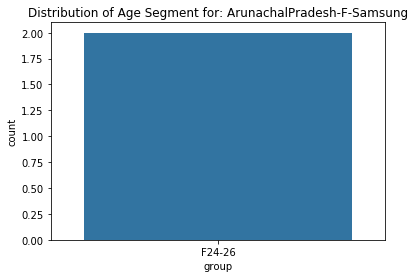

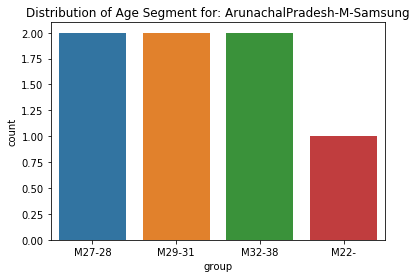

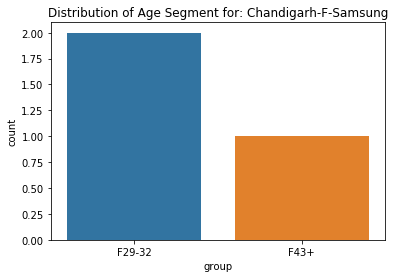

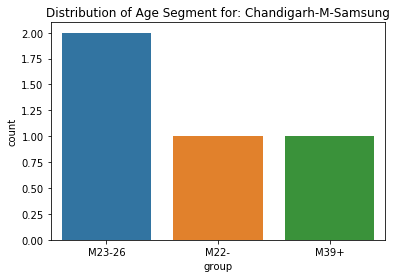

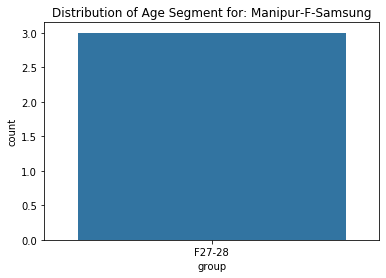

...

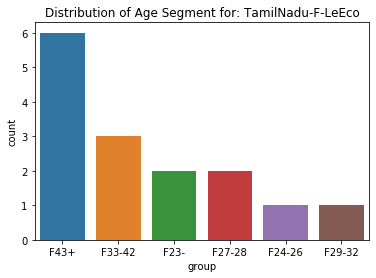

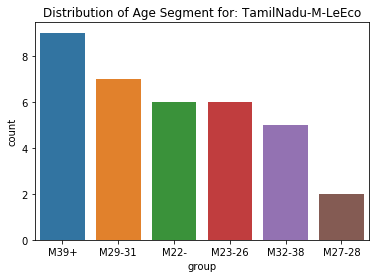

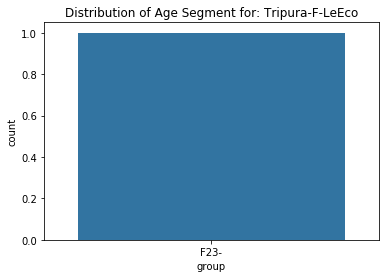

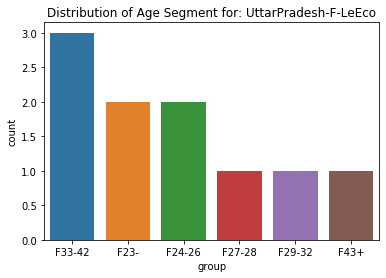

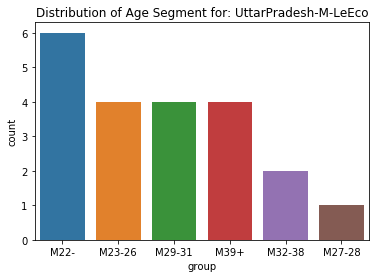

In [161]:
phone_list = ['Samsung', 'Xiaomi','Huawei','OPPO','Coolpad','Meizu','vivo','Lenovo','HTC','LeEco']
#phone_list = ['Samsung']
for phone in phone_list:
    df1 = df_final.loc[df_final['phone_brand']==phone]
    group_df=df1.groupby(['state', 'gender','phone_brand','group'])['group'].count().reset_index(name='count')
    group_df['type'] = group_df['state'] + "-" + group_df['gender']+ "-" + group_df['phone_brand']
    group_df1 = group_df[['type','group','count']]
    #print(group_df1)
    list1 = (group_df1['type'].unique())
    for item in list1:
        df_tmp = group_df1.loc[group_df1['type']==item]
        #print(df_tmp)
        grouped1=df_tmp.sort_values(by =['count'], ascending=False)
        g=sns.barplot(x='group',y='count',data=grouped1)
        g.set_title("Distribution of Age Segment for: " + item)
        plt.show()

## 8. Hourly distribution of Phone Calls.

In [166]:
# Perform the analysis from df_sixstates 
df_sixstates['timestamp'] =  pd.to_datetime(df_sixstates['timestamp'], infer_datetime_format=True)

In [167]:
# Extract hour from dataframe and use groupby to count the events 
def hr_func(ts):
    return ts.hour

df_sixstates['time_hour'] = df_sixstates['timestamp'].apply(hr_func)
df_sixstates.head()

,event_id,device_id,timestamp,longitude,latitude,city,state,time_hour
3,448114,5731369272434022440,2016-05-03 13:21:16,80.343613,13.153332,Chennai,TamilNadu,13
6,2948755,5536513450525271144,2016-05-03 16:20:14,80.359796,13.128174,Chennai,TamilNadu,16
10,3219828,-3433061233631405742,2016-05-03 00:27:21,80.290779,13.115427,Chennai,TamilNadu,0
14,460645,7983871429718484702,2016-05-04 21:04:40,80.335435,13.189053,Chennai,TamilNadu,21
15,998037,7594215820567965078,2016-05-03 20:59:09,80.306871,13.172970,Chennai,TamilNadu,20


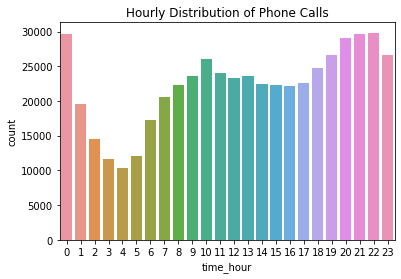

In [172]:
grouped = df_sixstates.groupby(['time_hour'])['event_id'].count().reset_index(name='count')
g=sns.barplot(x='time_hour',y='count',data=grouped)
g.set_title("Hourly Distribution of Phone Calls")
plt.show()

## 9. Plot the Users on the Map using any suitable package.

In [173]:
import folium

def plotDot(point):
    '''input: series that contains a numeric named latitude and a numeric named longitude
    this function creates a CircleMarker and adds it to your this_map'''
    folium.CircleMarker(location=[point.latitude, point.longitude],
                        radius=5,
                        weight=0,
                        fill_color='#000000').add_to(this_map)


In [177]:
# Get unique values of lat,long and draw the dots on map
print(df_sixstates_unique.shape)
#create a map
this_map = folium.Map(prefer_canvas=True)
#use df.apply(,axis=1) to iterate through every row in your dataframe
df_sixstates_unique.apply(plotDot, axis = 1)
#Set the zoom to the maximum possible
this_map.fit_bounds(this_map.get_bounds())
this_map

(9564, 7)
